# Visão Computacional e Deep Learning para Sensoriamento Remoto com Python


#Capítulo 24 - Detecção de mudas de arroz em Imagens de Drones com a YOLOR

## YOLOR

YOLOR é um algoritmo de aprendizado de máquina de última geração para detecção de objetos, diferente de YOLOv1-YOLOv5 devido à diferença de autoria, arquitetura e infraestrutura de modelo. YOLOR significa “You Only Learn One Representation”, não deve ser confundido com YOLO versões 1 a 4, onde YOLO significa “You Only Look Once”. YOLOR é proposto como uma “rede unificada para codificar conhecimento implícito e conhecimento explícito juntos”. As descobertas do trabalho de pesquisa da YOLOR com o título “You Only Learn One Representation: Unified Network for Multiple Tasks” afirma que os resultados demonstram o benefício do uso do conhecimento implícito.

Os autores do YoloR são Chien-Yao Wang, I-Hau Yeh e Hong-Yuan Mark Liao. Junto com Alexey Boschovskiy, esses quatro autores estiveram envolvidos no desenvolvimento do CSPNet, YoloV4(2020), Scaled-YoloV4 (2020) e YoloV7 (2022). YoloV4 foi um artigo aclamado pela crítica no qual Scaled-YoloV4 fez melhorias adicionais. Scaled-YoloV4 foi um “artigo de melhoria de arquitetura”. YoloR (2021) é baseado em modelos Scaled-YoloV4 e tem sua própria abordagem para melhorar ainda mais os resultados.

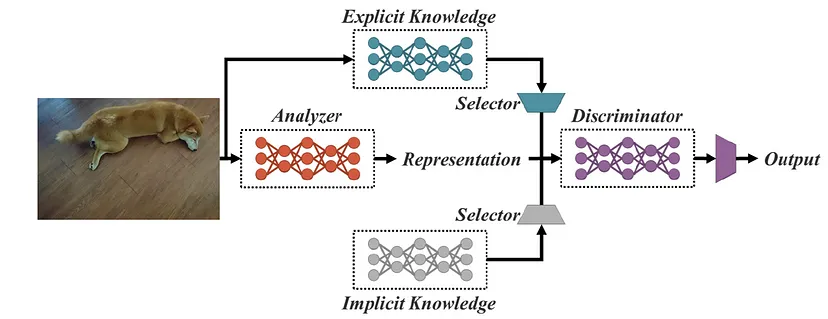

Os seres humanos são capazes de aprender e compreender o mundo físico com base na visão, audição, tato (conhecimento explícito) – mas também com base na experiência passada (conhecimento implícito). Portanto, os seres humanos são capazes de processar dados totalmente novos de forma eficaz, fazendo uso de experiências abundantes de aprendizado anterior, obtidas por meio do aprendizado normal e armazenadas no cérebro. Com base nessa ideia, o trabalho de pesquisa do YOLOR descreve uma abordagem para combinar conhecimento explícito, definido como aprendizado baseado em dados e entradas fornecidos, com conhecimento implícito aprendido subconscientemente. Portanto, o conceito de YOLOR é baseado na codificação do conhecimento implícito e explícito juntos, semelhante a como os cérebros dos mamíferos processam o conhecimento implícito e explícito em conjunto. A rede unificada proposta no YOLOR gera uma representação unificada para atender a uma variedade de tarefas ao mesmo tempo. Existem três processos notáveis pelos quais essa arquitetura se torna funcional: alinhamento do espaço do kernel, refinamento de previsão e uma rede neural convolucional (CNN) com aprendizado multitarefa. De acordo com os resultados, quando o conhecimento implícito é introduzido na rede neural que já foi treinada com o conhecimento explícito, a rede beneficia o desempenho de várias tarefas.

### O que há de novo em YOLOR

Os seres humanos podem responder a diferentes perguntas com uma única entrada. Dado um dado, os humanos podem analisá-los de diferentes ângulos. Por exemplo, uma foto de algo pode provocar respostas diferentes em relação à ação representada, localização, etc. O YOLOR visa dar essa capacidade aos modelos de aprendizado de máquina - para que eles sejam capazes de atender a muitas tarefas com uma única entrada. As Redes Neurais Convolucionais (CNN) geralmente atendem a um objetivo específico, enquanto podem ser treinadas para resolver vários problemas ao mesmo tempo, que é exatamente o objetivo do YOLOR. As CNNs geralmente são criadas com um único objetivo em mente. Enquanto as CNNs aprendem como analisar entradas para obter saídas, YOLOR tenta fazer com que as CNNs (1) aprendam como obter saídas e também (2) quais poderiam ser todas as diferentes saídas. Em vez de apenas uma saída, ela pode ter várias.

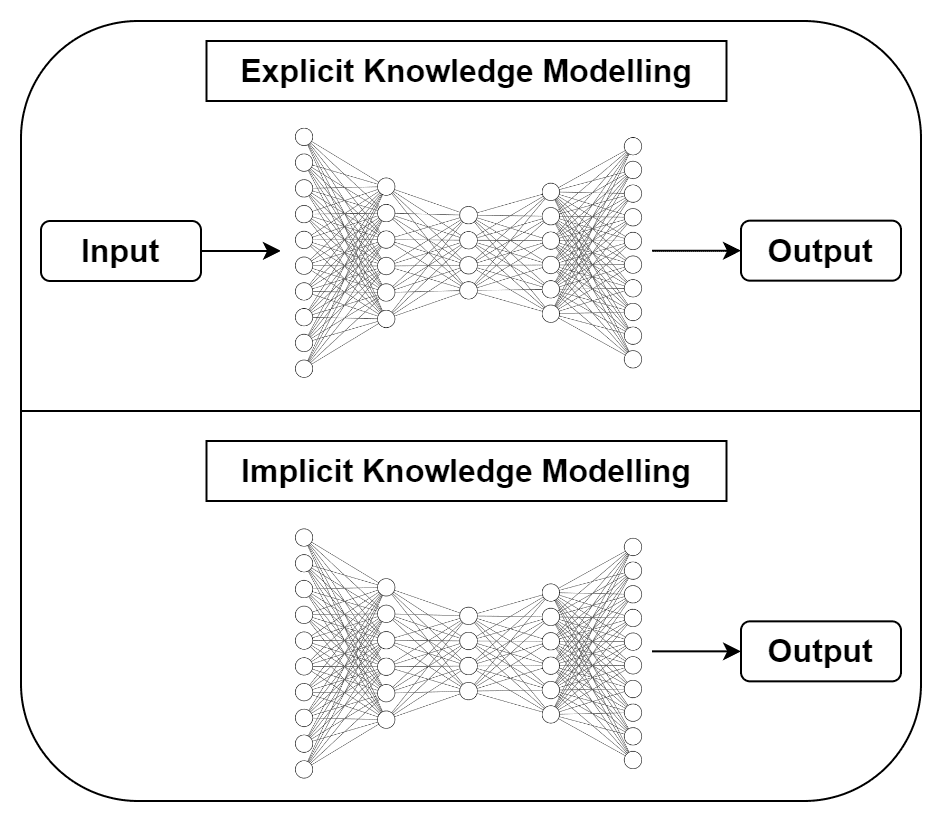

### O que é Informação Explícita

O conhecimento explícito é fornecido às redes neurais, fornecendo metadados claros ou bancos de dados de imagens que são completamente anotados ou bem organizados. O conhecimento explícito pode ser pensado como flashcards para o modelo de aprendizado de máquina, com definições claras e imagens/entradas correspondentes a essas imagens. Depois que o modelo passa pelo baralho de flashcards, ele agora é bem versado na classificação de imagens com suas respectivas definições, ou “classes”. O conhecimento explícito para YOLOR é obtido das camadas rasas das redes neurais. Esse conhecimento corresponde diretamente às observações que se supõe serem feitas. O aprendizado profundo explícito é realizado usando consultas/chaves e redes não locais para obter autoatenção ou seleção automática de kernels usando dados de entrada.

### O que é informação implícita

O conhecimento implícito pode efetivamente auxiliar os modelos de aprendizado de máquina na execução de tarefas com o YOLOR. Para os humanos, o conhecimento implícito é desenvolvido subconscientemente. Para redes neurais, o conhecimento implícito é obtido por recursos nas camadas profundas. O conhecimento que não corresponde às observações também é conhecido como conhecimento implícito.

### Como modelar o conhecimento implícito?

Vamos discutir os métodos para modelar o conhecimento implícito.

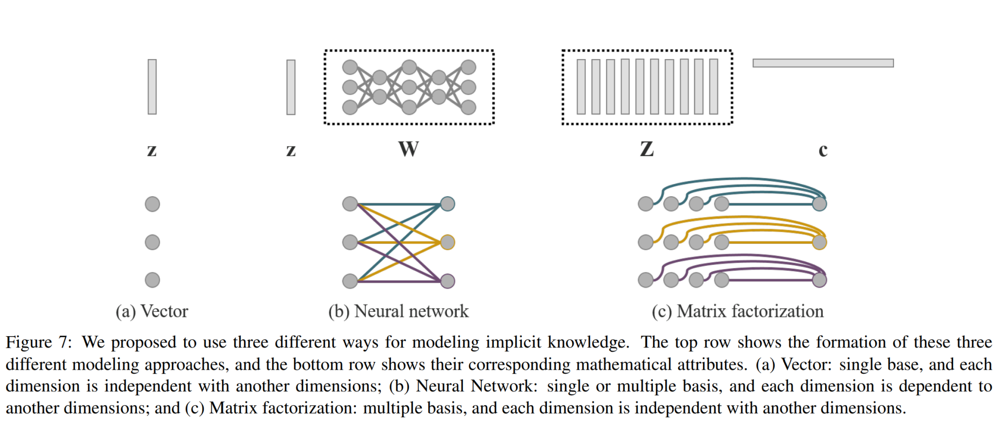

O artigo do YoloR fornece três métodos pelos quais podemos modelar o conhecimento implícito.

- Vetor / Matriz / Tensor (z): Usando um vetor z como prior do conhecimento implícito e diretamente como representação implícita.
- Rede neural (Wz): Use o vetor z como o anterior do conhecimento implícito e, em seguida, use a matriz de pesos W para realizar combinação linear ou não linearização, que pode ser usada como uma representação implícita.
- Fatoração de matrizes (ZTc): Use vários vetores como antecedentes do conhecimento implícito, e essas bases anteriores implícitas Z e coeficiente c formarão uma representação implícita.

### Arquitetura completa do YoloR-P6

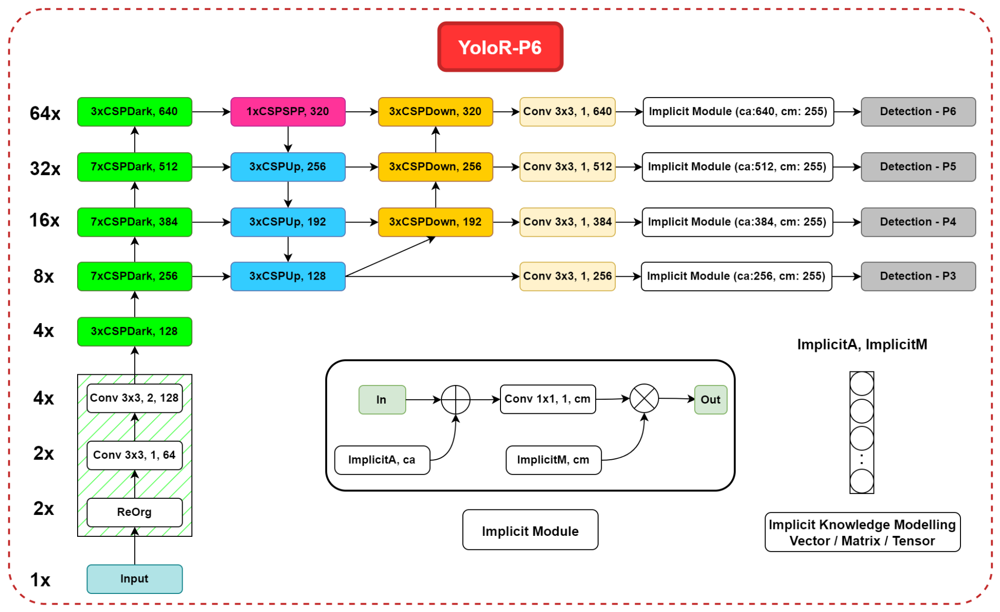

## Implementação da YOLOR

Link para o dataset: https://drive.google.com/drive/folders/1fapXiE0C7K_tp4VA0rX0p12K-vwOsqi-?usp=sharing

Vamos aplicar a YOLOR em imagens de drone para detectar brotos de arroz.

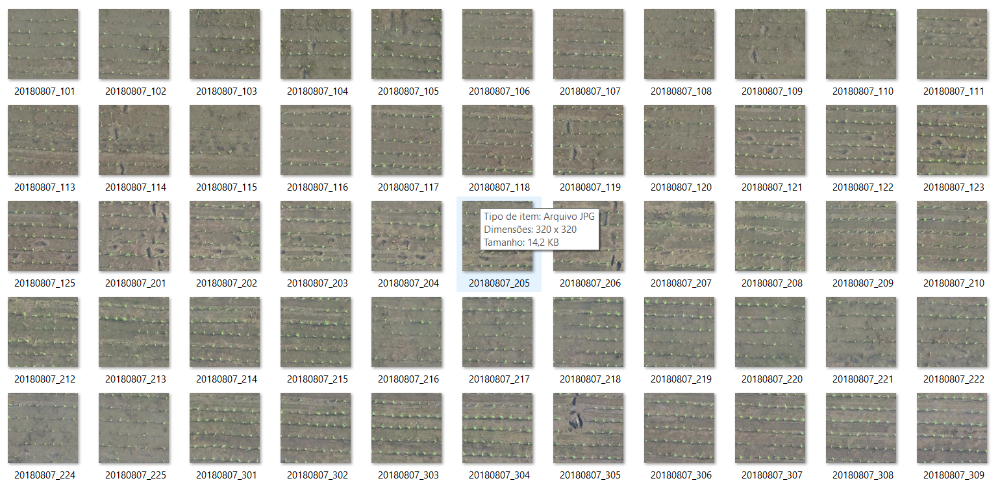

Primeiro vamos instalar algumas bilbiotecas, importá-las e conectar com o Google Drive:

In [ ]:
!pip install pandas fiona shapely pyproj rtree
!pip install rasterio
!pip install geopandas

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.6/16.6 MB 45.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 62.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 41.4 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.9/20.9 MB 20.4 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 26.4 MB/s eta 0:00:00


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import rasterio
import geopandas as gpd
import numpy as np
from matplotlib import pyplot as plt
import cv2
from rasterio.features import rasterize
from rasterio.windows import Window
from rasterio.plot import show
import os
from shapely.geometry import box
from shapely.ops import unary_union
import json
from shapely.geometry import shape
from shapely.geometry import Polygon
from shapely.geometry import MultiPolygon
from shapely.ops import unary_union
import shapely
import math
import pandas as pd
from skimage import io
from skimage.io import imsave
from sklearn import model_selection
import os
import shutil
import json
import ast
import numpy as np
from tqdm import tqdm
import pandas as  pd
import seaborn as sns
import fastai.vision as vision
import xml.etree.ElementTree as ET

Vamos setar os caminhos da pasta onde estão as imagens e da pasta onde estão as anotações:

In [ ]:
path_imgs = '/content/drive/MyDrive/Datasets/Rice Detection/RiceSeedlingDetection/JPEGImages'
path_labels = '/content/drive/MyDrive/Datasets/Rice Detection/RiceSeedlingDetection/Annotations'

In [ ]:
images_files = [f for f in os.listdir(path_imgs)]

In [ ]:
len(images_files)

600

A partir da lista de imagens separamos o dataset em treinamento e validação:

In [ ]:
images_files_train, images_files_valid= model_selection.train_test_split(
    images_files,
    test_size=0.1,
    random_state=42,
    shuffle=True,
)
print(len(images_files_train))
print(len(images_files_valid))

540
60


Criamos as duas pastas no /content e agora vamos copiar as imagens do Drive para estas pastas. Teremos 540 imagens para treinar e 60 para validar.

In [ ]:
destination_1 = 'train'
destination_2 = 'validation'

if not os.path.isdir(destination_1):
    os.mkdir(destination_1)
if not os.path.isdir(destination_2):
    os.mkdir(destination_2)

In [ ]:
path_data_train = '/content/train'
for images in images_files_train:
  img = io.imread(os.path.join(path_imgs,images))
  imsave(os.path.join(path_data_train,images.split('.')[0] + '.jpg'), img)

In [ ]:
path_data_valid = '/content/validation'
for images in images_files_valid:
  img = io.imread(os.path.join(path_imgs,images))
  imsave(os.path.join(path_data_valid,images.split('.')[0] + '.jpg'), img)

In [ ]:
len(os.listdir(path_data_train))

540

In [ ]:
len(os.listdir(path_data_valid))

60

Vamos então importar os xmls contendo as informações. Criaremos um dataframe.

In [ ]:
xml_list = []
for xml_file in os.listdir(path_labels):
  tree = ET.parse(os.path.join(path_labels,xml_file))
  root = tree.getroot()
  for member in root.findall('object'):
    value = (root.find('filename').text,
              int(root.find('size')[0].text),
              int(root.find('size')[1].text),
              member[0].text,
              int(member[4][0].text),
              int(member[4][1].text),
              int(member[4][2].text),
              int(member[4][3].text)
              )
    xml_list.append(value)
column_name = ['filename', 'width', 'height', 'class', 'xmin', 'ymin', 'xmax', 'ymax']
xml_df = pd.DataFrame(xml_list, columns=column_name)

In [ ]:
xml_df

,filename,width,height,class,xmin,ymin,xmax,ymax
0,20180823_103.jpg,320,320,RiceSeedling,278,303,306,320
1,20180823_103.jpg,320,320,RiceSeedling,251,312,266,320
2,20180823_103.jpg,320,320,RiceSeedling,126,310,146,320
3,20180823_103.jpg,320,320,RiceSeedling,165,308,182,320
4,20180823_103.jpg,320,320,RiceSeedling,42,307,55,320
...,...,...,...,...,...,...,...,...
25984,20180823_818.jpg,320,320,RiceSeedling,254,248,280,278
25985,20180823_818.jpg,320,320,RiceSeedling,291,253,320,292
25986,20180823_818.jpg,320,320,RiceSeedling,199,248,232,280
25987,20180823_818.jpg,320,320,RiceSeedling,39,125,70,158


Setamos o id da classe:

In [ ]:
xml_df['class'] = 0

Vamos plotar um exmplo de uma imagem com as anotações:

In [ ]:
list_of_image = xml_df['filename'].unique()

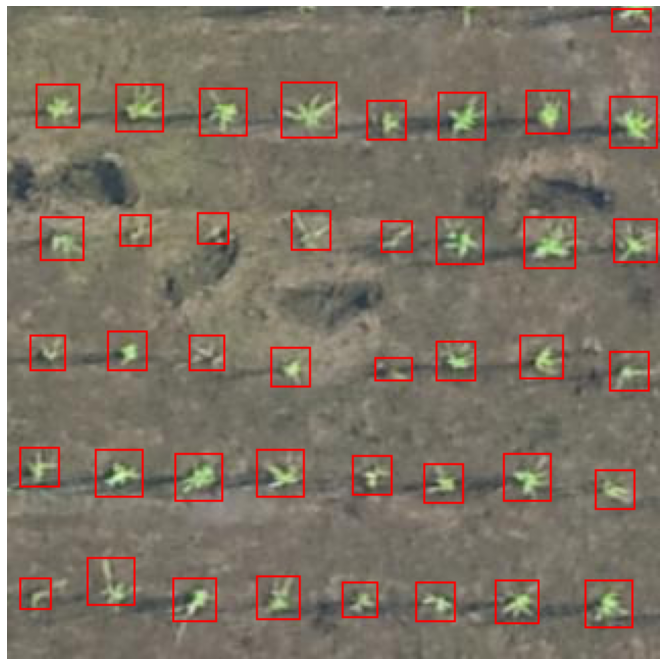

In [ ]:
i = 3
img = io.imread(os.path.join(path_imgs,list_of_image[i]))
detec = xml_df[xml_df['filename'] == list_of_image[i]]
for i, row in detec.iterrows():
  color = (255,0,0)
  cv2.rectangle(img, (max(0, row['xmin']), max(0, row['ymin']) , max(0, row['xmax'] - row['xmin']), max(0, row['ymax'] - row['ymin'])), color, 1)
plt.figure(figsize=(12,12))
plt.imshow(img)
plt.axis('off')
plt.show()

In [ ]:
train_df = xml_df[xml_df['filename'].isin(os.listdir(path_data_train))].copy()
valid_df = xml_df[xml_df['filename'].isin(os.listdir(path_data_valid))].copy()

In [ ]:
train_df

,filename,width,height,class,xmin,ymin,xmax,ymax
0,20180823_103.jpg,320,320,0,278,303,306,320
1,20180823_103.jpg,320,320,0,251,312,266,320
2,20180823_103.jpg,320,320,0,126,310,146,320
3,20180823_103.jpg,320,320,0,165,308,182,320
4,20180823_103.jpg,320,320,0,42,307,55,320
...,...,...,...,...,...,...,...,...
25984,20180823_818.jpg,320,320,0,254,248,280,278
25985,20180823_818.jpg,320,320,0,291,253,320,292
25986,20180823_818.jpg,320,320,0,199,248,232,280
25987,20180823_818.jpg,320,320,0,39,125,70,158


A partir das colunas de xmin, ymin, xmax e ymax, vamos obter os bounds:

In [ ]:
def getBounds(df):
    try:
        xmin = df['xmin']
        ymin = df['ymin']
        xmax = df['xmax']
        ymax = df['ymax']
        return (xmin, ymin, xmax, ymax)
    except:
        return np.nan

def getWidth(bounds):
    try:
        (xmin, ymin, xmax, ymax) = bounds
        return np.abs(xmax - xmin)
    except:
        return np.nan

def getHeight(bounds):
    try:
        (xmin, ymin, xmax, ymax) = bounds
        return np.abs(ymax - ymin)
    except:
        return np.nan

In [ ]:
train_df['bounds'] = train_df.apply(getBounds, axis=1)
train_df.loc[:,'width'] = train_df.loc[:,'bounds'].apply(getWidth)
train_df.loc[:,'height'] = train_df.loc[:,'bounds'].apply(getHeight)
train_df.head(10)

,filename,width,height,class,xmin,ymin,xmax,ymax,bounds
0,20180823_103.jpg,28,17,0,278,303,306,320,"(278, 303, 306, 320)"
1,20180823_103.jpg,15,8,0,251,312,266,320,"(251, 312, 266, 320)"
2,20180823_103.jpg,20,10,0,126,310,146,320,"(126, 310, 146, 320)"
3,20180823_103.jpg,17,12,0,165,308,182,320,"(165, 308, 182, 320)"
4,20180823_103.jpg,13,13,0,42,307,55,320,"(42, 307, 55, 320)"
5,20180823_103.jpg,22,18,0,86,302,108,320,"(86, 302, 108, 320)"
6,20180823_103.jpg,16,22,0,2,298,18,320,"(2, 298, 18, 320)"
7,20180823_103.jpg,30,26,0,206,294,236,320,"(206, 294, 236, 320)"
8,20180823_103.jpg,41,30,0,243,250,284,280,"(243, 250, 284, 280)"
9,20180823_103.jpg,34,36,0,286,248,320,284,"(286, 248, 320, 284)"


In [ ]:
valid_df['bounds'] = valid_df.apply(getBounds, axis=1)
valid_df.loc[:,'width'] = valid_df.loc[:,'bounds'].apply(getWidth)
valid_df.loc[:,'height'] = valid_df.loc[:,'bounds'].apply(getHeight)
valid_df.head(10)

,filename,width,height,class,xmin,ymin,xmax,ymax,bounds
904,20180814_516.jpg,22,22,0,281,287,303,309,"(281, 287, 303, 309)"
905,20180814_516.jpg,24,24,0,245,287,269,311,"(245, 287, 269, 311)"
906,20180814_516.jpg,18,18,0,126,288,144,306,"(126, 288, 144, 306)"
907,20180814_516.jpg,26,26,0,81,288,107,314,"(81, 288, 107, 314)"
908,20180814_516.jpg,18,18,0,168,285,186,303,"(168, 285, 186, 303)"
909,20180814_516.jpg,22,22,0,44,286,66,308,"(44, 286, 66, 308)"
910,20180814_516.jpg,22,22,0,203,283,225,305,"(203, 283, 225, 305)"
911,20180814_516.jpg,22,22,0,5,282,27,304,"(5, 282, 27, 304)"
912,20180814_516.jpg,24,24,0,41,232,65,256,"(41, 232, 65, 256)"
913,20180814_516.jpg,20,20,0,93,228,113,248,"(93, 228, 113, 248)"


Vamos salvar os dataframes de treinamento e validação em arquivos .csv:

In [ ]:
def convert(data, data_type):
    df = data.groupby('filename')['bounds'].apply(list).reset_index(name='bboxes')
    df['classes'] = data.groupby('filename')['class'].apply(list).reset_index(drop=True)
    df.to_csv(data_type + '.csv', index=False)
    print(data_type)
    print(df.shape)
    print(df.head())

df_train = convert(train_df, '/content/train')
df_valid = convert(valid_df, '/content/validation')

/content/train
(540, 3)
           filename                                             bboxes  \
0  20180807_101.jpg  [(159, 283, 181, 305), (34, 281, 48, 295), (20...   
1  20180807_102.jpg  [(304, 292, 319, 312), (217, 289, 239, 311), (...   
2  20180807_103.jpg  [(309, 308, 319, 319), (270, 304, 288, 319), (...   
3  20180807_104.jpg  [(1, 308, 9, 319), (280, 259, 300, 279), (236,...   
4  20180807_105.jpg  [(291, 271, 315, 295), (208, 267, 228, 287), (...   

                                             classes  
0  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...  
1  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...  
2  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...  
3  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...  
4  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...  
/content/validation
(60, 3)
           filename                                             bboxes  \
0  20180807_124.jpg  [(215, 264, 237, 286), (134, 263, 156, 285), (...   
1  20180807_202.jpg  [(14

Para treinar a YOLOR baixamos sua implementação do github e instalamos seus requerimentos:

In [ ]:
!git clone https://github.com/WongKinYiu/yolor

Cloning into 'yolor'...
remote: Enumerating objects: 492, done.
remote: Total 492 (delta 0), reused 0 (delta 0), pack-reused 492
Receiving objects: 100% (492/492), 3.42 MiB | 13.08 MiB/s, done.
Resolving deltas: 100% (227/227), done.


In [ ]:
!pip install torchvision --upgrade -q
!pip install wandb --upgrade

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 48.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.9/178.9 KB 20.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.0/184.0 KB 21.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 KB 8.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 140.6/140.6 KB 16.7 MB/s eta 0:00:00
  Created wheel for pathtools: filename=pathtools-0.1.2-py3-none-any.whl size=8806 sha256=7165099775e48f8571cee99559e77733221227ba21827c8e01d298b1c2979615
  Stored in directory: /root/.cache/pip/wheels/4c/8e/7e/72fbc243e1aeecae64a96875432e70d4e92f3d2d18123be004
Successfully built pathtools
  Attempting uninstall: urllib3
    Found existing installation: urllib3 1.24.3
    Uninstalling urllib3-1.24.3:
      Successfully uninstalled urllib3-1.24.3


In [ ]:
shutil.copy2(
            '/content/drive/MyDrive/Datasets/Rice Detection/requirements.txt',
            '/content/yolor/requirements.txt')

In [ ]:
%cd yolor
!pip install -qr requirements.txt

/content/yolor
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 776.8/776.8 MB 1.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 80.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 51.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchtext 0.14.1 requires torch==1.13.1, but you have torch 1.7.0 which is incompatible.
torchaudio 0.13.1+cu116 requires torch==1.13.1, but you have torch 1.7.0 which is incompatible.
fastai 2.7.10 requires torchvision>=0.8.2, but you have torchvision 0.8.1 which is incompatible.


In [ ]:
%cd ..
!git clone https://github.com/JunnYu/mish-cuda
%cd mish-cuda
!git reset --hard 6f38976064cbcc4782f4212d7c0c5f6dd5e315a8
!python setup.py build install
%cd ..

/content
Cloning into 'mish-cuda'...
remote: Enumerating objects: 195, done.
remote: Counting objects: 100% (88/88), done.
remote: Compressing objects: 100% (75/75), done.
remote: Total 195 (delta 7), reused 79 (delta 3), pack-reused 107
Receiving objects: 100% (195/195), 208.77 KiB | 13.05 MiB/s, done.
Resolving deltas: 100% (56/56), done.
/content/mish-cuda
HEAD is now at 6f38976 Update README.md
No CUDA runtime is found, using CUDA_HOME='/usr/local/cuda'
/usr/lib/python3.8/distutils/extension.py:131: UserWarning: Unknown Extension options: 'headers'
  warnings.warn(msg)
running build
running build_py
creating build
creating build/lib.linux-x86_64-3.8
creating build/lib.linux-x86_64-3.8/mish_cuda
copying src/mish_cuda/__init__.py -> build/lib.linux-x86_64-3.8/mish_cuda
running egg_info
creating src/mish_cuda.egg-info
writing src/mish_cuda.egg-info/PKG-INFO
writing dependency_links to src/mish_cuda.egg-info/dependency_links.txt
writing requirements to src/mish_cuda.egg-info/requires.t

In [ ]:
!git clone https://github.com/fbcotter/pytorch_wavelets
%cd pytorch_wavelets
!pip install .
%cd ..

Cloning into 'pytorch_wavelets'...
remote: Enumerating objects: 978, done.
remote: Counting objects: 100% (142/142), done.
remote: Compressing objects: 100% (96/96), done.
remote: Total 978 (delta 79), reused 91 (delta 46), pack-reused 836
Receiving objects: 100% (978/978), 6.80 MiB | 23.52 MiB/s, done.
Resolving deltas: 100% (663/663), done.
/content/pytorch_wavelets
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Processing /content/pytorch_wavelets
  Preparing metadata (setup.py) ... done
  Created wheel for pytorch-wavelets: filename=pytorch_wavelets-1.3.0-py3-none-any.whl size=54869 sha256=9042bac5f5e0c57b74d12d3029747beb30195efbb9e0667e621321efd081d964
  Stored in directory: /tmp/pip-ephem-wheel-cache-zhc1_wwk/wheels/03/f2/f0/5de125116a85e1b4af9b84a4cc3f95c55f1535cd2d0344dd2c
Successfully built pytorch-wavelets
/content


In [ ]:
%cd yolor
!ls

/content/yolor
cfg	 detect.py  LICENSE    requirements.txt  train.py
darknet  figure     models     scripts		 tune.py
data	 inference  README.md  test.py		 utils


Dentro da pasta principal da yolor criamos uma pasta para receber as nossas imagens e anotações:

In [ ]:
!mkdir plant_data
%cd plant_data

/content/yolor/plant_data


E dentro desta pasta criamos diretórios para imagens e para os labels:

In [ ]:
!mkdir images
!mkdir labels
%cd images
!mkdir train
!mkdir validation
%cd ..
%cd labels
!mkdir train
!mkdir validation
%cd ..
%cd ..
%cd ..

/content/yolor/plant_data/images
/content/yolor/plant_data
/content/yolor/plant_data/labels
/content/yolor/plant_data
/content/yolor
/content


In [ ]:
for root,dir,_ in os.walk('yolor/plant_data'):
    print(root)
    print(dir)

yolor/plant_data
['labels', 'images']
yolor/plant_data/labels
['validation', 'train']
yolor/plant_data/labels/validation
[]
yolor/plant_data/labels/train
[]
yolor/plant_data/images
['validation', 'train']
yolor/plant_data/images/validation
[]
yolor/plant_data/images/train
[]


O proximo passo é copiar as imagens de treinamento e validação para seus respectivos diretórios na pasta que criamos. Também vamos abrir os arquivos .csv de treinamento e validação e para cada imagem criaremos um .txt com as anotações pertencentes à imagem. Os valores de bounds serão normalizados, e alimentaremos o modelo com os valores de x e y centrais, altura e largura.

In [ ]:
INPUT_PATH = '/content/'
OUTPUT_PATH = '/content/yolor/plant_data'
def process_data(data, data_type='train'):
    for _, row in tqdm(data.iterrows(), total = len(data)):
        image_name = row['filename'].split('.')[0]
        bounding_boxes = row['bboxes']
        classes = row['classes']
        yolo_data = []
        for bbox, Class in zip(bounding_boxes, classes):

            x_min = bbox[0]
            y_min = bbox[1]
            x_max = bbox[2]
            y_max = bbox[3]

            x_center = (x_min + x_max) / 2.0 / 320
            y_center = (y_min + y_max) / 2.0 / 320
            x_extend = (x_max - x_min) / 320
            y_extend = (y_max - y_min) / 320

            yolo_data.append([Class, x_center, y_center, x_extend, y_extend])
            ''''x = bbox[0]
            y = bbox[1]
            w = bbox[2]
            h = bbox[3]
            x_center = x + w / 2
            y_center = y + h / 2

            x_center /= 1024
            y_center /= 1024
            w /= 1024
            h /= 1024
            yolo_data.append([Class, x_center, y_center, w, h])'''
        yoy_data = np.array(yolo_data)
        np.savetxt(
            os.path.join(OUTPUT_PATH, f"labels/{data_type}/{image_name}.txt"),
            yolo_data,
            fmt = ["%d", "%f", "%f", "%f", "%f"]
        )
        shutil.copyfile(
            os.path.join(INPUT_PATH, f"{data_type}/{image_name}.jpg"),
            os.path.join(OUTPUT_PATH, f"images/{data_type}/{image_name}.jpg")
        )

df_train = pd.read_csv('/content/train.csv')
df_train.bboxes = df_train.bboxes.apply(ast.literal_eval)
df_train.classes = df_train.classes.apply(ast.literal_eval)

df_valid = pd.read_csv('/content/validation.csv')
df_valid.bboxes = df_valid.bboxes.apply(ast.literal_eval)
df_valid.classes = df_valid.classes.apply(ast.literal_eval)

process_data(df_train, data_type='train')
process_data(df_valid, data_type='validation')

100%|██████████| 60/60 [00:00<00:00, 753.22it/s]


In [ ]:
f = open('/content/yolor/plant_data/labels/train/'+os.listdir("/content/yolor/plant_data/labels/train/")[0])
print(f.name)
for l in f:
    print(l)

/content/yolor/plant_data/labels/train/20180814_314.txt
0 0.450000 0.937500 0.068750 0.068750

0 0.325000 0.940625 0.081250 0.081250

0 0.193750 0.928125 0.068750 0.068750

0 0.837500 0.921875 0.068750 0.068750

0 0.703125 0.909375 0.068750 0.068750

0 0.575000 0.918750 0.075000 0.075000

0 0.068750 0.896875 0.075000 0.075000

0 0.971875 0.746875 0.050000 0.050000

0 0.206250 0.746875 0.050000 0.050000

0 0.328125 0.746875 0.068750 0.068750

0 0.728125 0.734375 0.056250 0.056250

0 0.075000 0.743750 0.068750 0.068750

0 0.462500 0.743750 0.062500 0.062500

0 0.590625 0.737500 0.075000 0.075000

0 0.970313 0.571875 0.053125 0.068750

0 0.093750 0.553125 0.056250 0.056250

0 0.331250 0.562500 0.075000 0.075000

0 0.853125 0.556250 0.068750 0.068750

0 0.462500 0.553125 0.081250 0.081250

0 0.728125 0.550000 0.081250 0.081250

0 0.218750 0.550000 0.075000 0.075000

0 0.600000 0.540625 0.062500 0.062500

0 0.973437 0.378125 0.046875 0.062500

0 0.206250 0.368750 0.062500 0.062500

0 0.0781

Agora vamos configurar alguns arquivos da yolor:

In [ ]:
%cd yolor

/content/yolor


In [ ]:
!bash scripts/get_pretrain.sh

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100  142M  100  142M    0     0  28.5M      0  0:00:04  0:00:04 --:--:-- 38.5M
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100  305M  100  305M    0     0  40.2M      0  0:00:07  0:00:07 --:--:-- 50.3M


Primeiro criamos o yaml com informações como caminhos das imagens, número de classe e nomes das classes.

In [ ]:
%%writefile rice.yaml

train: plant_data/images/train
val: plant_data/images/validation
nc: 1
names: ['rice']

Writing rice.yaml


E também podemos criar um aquivo com os nomes de identificação:

In [ ]:
%%writefile data/rice.names

rice

Writing data/rice.names


Antes de executar o treinamento vamos copiar o arquivo yolor-custom.cfg para a pasta cfg. Este arquivo contém algumas configurações para que a rede possa executar este exemplo:

In [ ]:
shutil.copy2(
            '/content/drive/MyDrive/Datasets/Rice Detection/yolor-custom.cfg',
            '/content/yolor/cfg')

'/content/yolor/cfg/yolor-custom.cfg'

Vamos agora executar o treinamento da YOLOR:

In [ ]:
!python train.py --weights "" --cfg cfg/yolor-custom.cfg --data rice.yaml --batch-size 12 --device 0 --name rice --epochs 10 --img 320

Using torch 1.7.0 CUDA:0 (Tesla P100-PCIE-16GB, 16280MB)

Namespace(adam=False, batch_size=12, bucket='', cache_images=False, cfg='cfg/yolor-custom.cfg', data='rice.yaml', device='0', epochs=10, evolve=False, exist_ok=False, global_rank=-1, hyp='data/hyp.scratch.1280.yaml', image_weights=False, img_size=[320, 320], local_rank=-1, log_imgs=16, multi_scale=False, name='rice', noautoanchor=False, nosave=False, notest=False, project='runs/train', rect=False, resume=False, save_dir='runs/train/rice', single_cls=False, sync_bn=False, total_batch_size=12, weights='', workers=8, world_size=1)
Start Tensorboard with "tensorboard --logdir runs/train", view at http://localhost:6006/
NumExpr defaulting to 4 threads.
Hyperparameters {'lr0': 0.01, 'lrf': 0.2, 'momentum': 0.937, 'weight_decay': 0.0005, 'warmup_epochs': 3.0, 'warmup_momentum': 0.8, 'warmup_bias_lr': 0.1, 'box': 0.05, 'cls': 0.5, 'cls_pw': 1.0, 'obj': 1.0, 'obj_pw': 1.0, 'iou_t': 0.2, 'anchor_t': 4.0, 'fl_gamma': 0.0, 'hsv_h': 0.015, '

Ao finalizar o treinamento podemos ver as imagens que foram usadas por batch:

In [ ]:
from IPython.display import Image, display

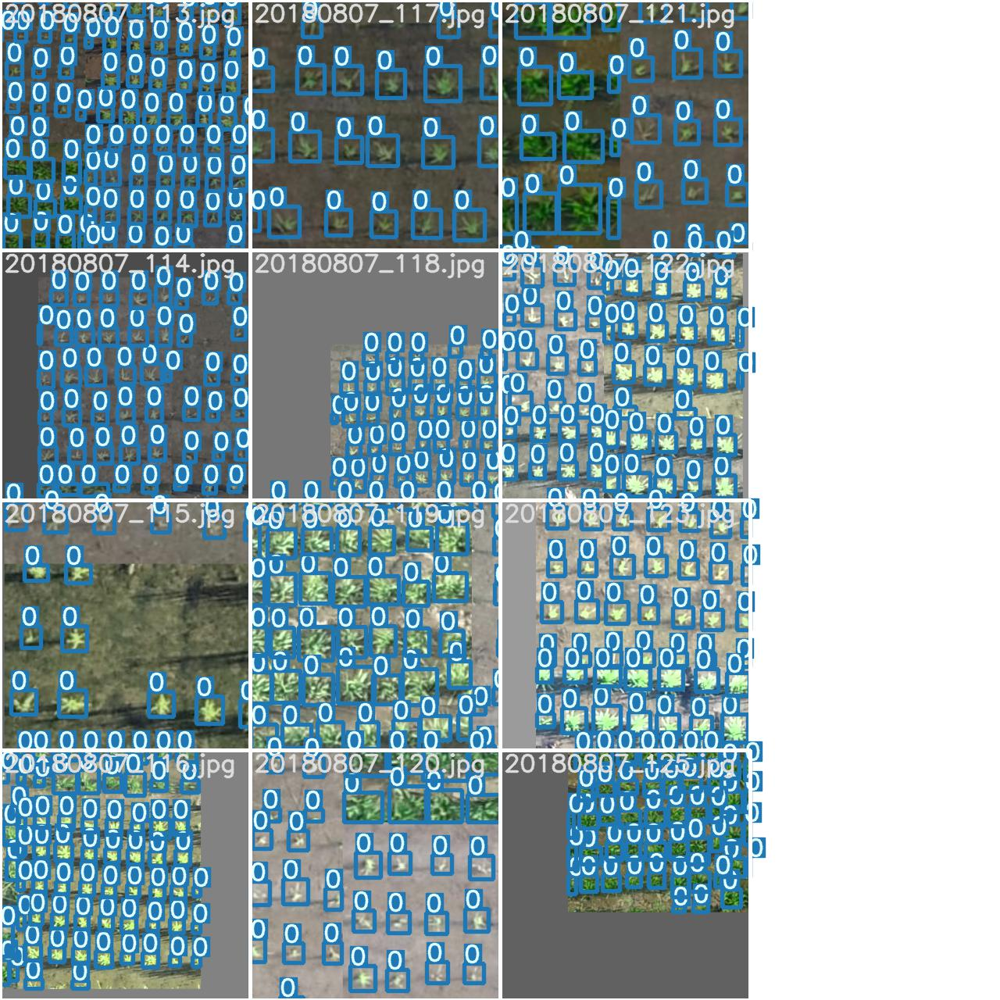

In [ ]:
Image(filename='/content/yolor/runs/train/rice/train_batch1.jpg', width=900)

Podemos aplicar o detect nas imagens de validação:

In [ ]:
!python detect.py --cfg cfg/yolor-custom.cfg --weights runs/train/rice/weights/best.pt --device 0 --source /content/validation --names /content/yolor/data/rice.names --img 320 --save-txt

Namespace(agnostic_nms=False, augment=False, cfg='cfg/yolor-custom.cfg', classes=None, conf_thres=0.4, device='0', img_size=320, iou_thres=0.5, names='/content/yolor/data/rice.names', output='inference/output', save_txt=True, source='/content/validation', update=False, view_img=False, weights=['runs/train/rice/weights/best.pt'])
image 1/60 /content/validation/20180807_124.jpg: 320x320 39 rices, Done. (0.032s)
image 2/60 /content/validation/20180807_202.jpg: 320x320 40 rices, Done. (0.033s)
image 3/60 /content/validation/20180807_219.jpg: 320x320 47 rices, Done. (0.032s)
image 4/60 /content/validation/20180807_222.jpg: 320x320 42 rices, Done. (0.031s)
image 5/60 /content/validation/20180807_225.jpg: 320x320 38 rices, Done. (0.034s)
image 6/60 /content/validation/20180807_315.jpg: 320x320 40 rices, Done. (0.030s)
image 7/60 /content/validation/20180807_403.jpg: 320x320 45 rices, Done. (0.032s)
image 8/60 /content/validation/20180807_408.jpg: 320x320 43 rices, Done. (0.032s)
image 9/60 /c

Após as detecções vamos ver como ficaram os resultados.

In [ ]:
print(sorted(os.listdir('/content/yolor/inference/output/')))

['20180807_124.jpg', '20180807_124.txt', '20180807_202.jpg', '20180807_202.txt', '20180807_219.jpg', '20180807_219.txt', '20180807_222.jpg', '20180807_222.txt', '20180807_225.jpg', '20180807_225.txt', '20180807_315.jpg', '20180807_315.txt', '20180807_403.jpg', '20180807_403.txt', '20180807_408.jpg', '20180807_408.txt', '20180807_418.jpg', '20180807_418.txt', '20180807_423.jpg', '20180807_423.txt', '20180807_516.jpg', '20180807_516.txt', '20180807_605.jpg', '20180807_605.txt', '20180807_606.jpg', '20180807_606.txt', '20180807_706.jpg', '20180807_706.txt', '20180807_709.jpg', '20180807_709.txt', '20180807_803.jpg', '20180807_803.txt', '20180807_809.jpg', '20180807_809.txt', '20180807_814.jpg', '20180807_814.txt', '20180807_819.jpg', '20180807_819.txt', '20180814_105.jpg', '20180814_105.txt', '20180814_117.jpg', '20180814_117.txt', '20180814_208.jpg', '20180814_208.txt', '20180814_219.jpg', '20180814_219.txt', '20180814_221.jpg', '20180814_221.txt', '20180814_222.jpg', '20180814_222.txt',

In [ ]:
os.listdir('/content/yolor/inference/output/')[0:6]

['20180814_811.jpg',
 '20180823_214.jpg',
 '20180814_411.txt',
 '20180814_208.jpg',
 '20180807_819.txt',
 '20180807_202.txt']

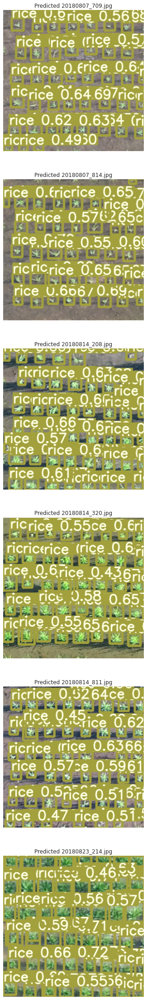

In [ ]:
sns.set({'figure.figsize':(60,40)})
fig, ax = plt.subplots(6, 1)
for i, img_f in enumerate(sorted([f for f in os.listdir('/content/yolor/inference/output/') if f.endswith('.jpg')][0:6])):
    image = vision.open_image('/content/yolor/inference/output/'+img_f)
    image.show(ax=ax[i], title= 'Predicted '+img_f)
    #plot_BBox(img_f, ax[i][1])
plt.show()

Vamos então apilcar o modelo treinado à um ortomosaico e gerar um arquivo de pontos de localizações a partir da detecção:

In [ ]:
path_img = '/content/drive/MyDrive/Datasets/Rice Detection/2018-08-14_ARI80_20m_Orthomosaic.tif'

In [ ]:
src_img = rasterio.open(path_img)

In [ ]:
img = src_img.read()

In [ ]:
img.shape

(4, 10687, 19876)

In [ ]:
img = img.transpose([1,2,0])

Após abrir a imagem vamos plotar:

(-0.5, 19875.5, 10686.5, -0.5)

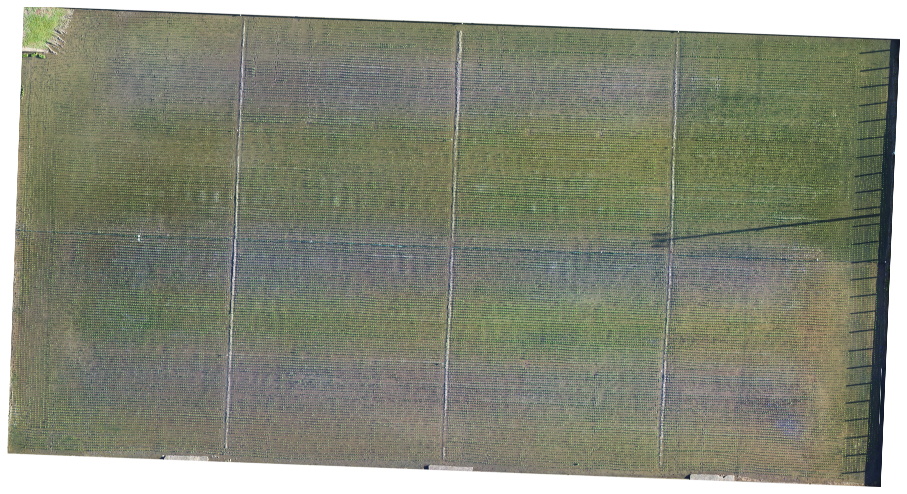

In [ ]:
plt.figure(figsize=[16,16])
plt.imshow(img)
plt.axis('off')

Então podemos dividir esse ortomosaico em vários patches:

In [ ]:
if not os.path.isdir('/content/Predict'):
    os.mkdir('/content/Predict')

In [ ]:
qtd = 0
out_meta = src_img.meta.copy()
for n in range((src_img.meta['width']//320)):
  for m in range((src_img.meta['height']//320)):
    x = (n*320)
    y = (m*320)
    window = Window(x,y,320,320)
    win_transform = src_img.window_transform(window)
    arr_win = src_img.read(window=window)
    arr_win = arr_win[0:3,:,:]
    if (arr_win.max() != 0) and (arr_win.shape[1] == 320) and (arr_win.shape[2] == 320):
      qtd = qtd + 1
      path_exp = '/content/Predict/img_' + str(qtd) + '.tif'
      out_meta.update({"driver": "GTiff","height": 320,"width": 320, "transform":win_transform})
      with rasterio.open(path_exp, 'w', **out_meta) as dst:
          for i, layer in enumerate(arr_win, start=1):
              dst.write_band(i, layer.reshape(-1, layer.shape[-1]))
      del arr_win

In [ ]:
print(qtd)

2046


Criamos uma cópia de cada patche em formato .jpg

In [ ]:
if not os.path.isdir('/content/Predict_jpg'):
    os.mkdir('/content/Predict_jpg')

path_data_pred = '/content/Predict_jpg'
imgs_to_pred = os.listdir('/content/Predict')
for images in imgs_to_pred:
  src = rasterio.open('/content/Predict/' + images)
  raster = src.read()
  raster = raster.transpose([1,2,0])
  raster = raster[:,:,0:3]
  imsave(os.path.join(path_data_pred,images.split('.')[0] + '.jpg'), raster)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: UserWarning: /content/Predict_jpg/img_1949.jpg is a low contrast image
  # This is added back by InteractiveShellApp.init_path()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: UserWarning: /content/Predict_jpg/img_1981.jpg is a low contrast image
  # This is added back by InteractiveShellApp.init_path()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: UserWarning: /content/Predict_jpg/img_2045.jpg is a low contrast image
  # This is added back by InteractiveShellApp.init_path()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: UserWarning: /content/Predict_jpg/img_1750.jpg is a low contrast image
  # This is added back by InteractiveShellApp.init_path()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: UserWarning: /content/Predict_jpg/img_2043.jpg is a low contrast image
  # This is added back by InteractiveShellApp.init_path()
/usr/local/lib/python3.7/dist-

Podemos ver um exemplo:

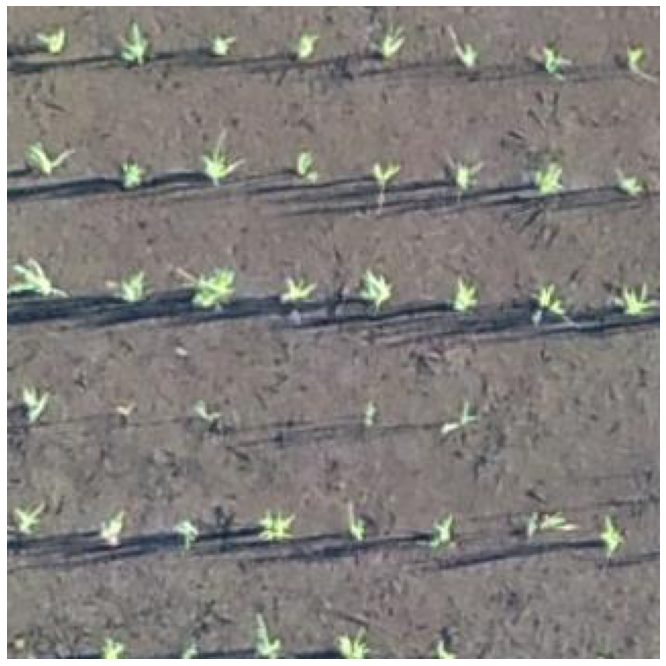

In [ ]:
img = io.imread('/content/Predict_jpg/img_500.jpg')
plt.figure(figsize=(12,12))
plt.imshow(img)
plt.axis('off')
plt.show()

Vamos aplicar o modelo a todas as imagens:

In [ ]:
!python detect.py --cfg cfg/yolor-custom.cfg --weights runs/train/rice/weights/best.pt --device 0 --source /content/Predict_jpg --names /content/yolor/data/rice.names --img 320 --save-txt

Namespace(agnostic_nms=False, augment=False, cfg='cfg/yolor-custom.cfg', classes=None, conf_thres=0.4, device='0', img_size=320, iou_thres=0.5, names='/content/yolor/data/rice.names', output='inference/output', save_txt=True, source='/content/Predict_jpg', update=False, view_img=False, weights=['runs/train/rice/weights/best.pt'])
image 1/2046 /content/Predict_jpg/img_1.jpg: 320x320 Done. (0.030s)
image 2/2046 /content/Predict_jpg/img_10.jpg: 320x320 1 rices, Done. (0.030s)
image 3/2046 /content/Predict_jpg/img_100.jpg: 320x320 23 rices, Done. (0.030s)
image 4/2046 /content/Predict_jpg/img_1000.jpg: 320x320 44 rices, Done. (0.031s)
image 5/2046 /content/Predict_jpg/img_1001.jpg: 320x320 41 rices, Done. (0.032s)
image 6/2046 /content/Predict_jpg/img_1002.jpg: 320x320 37 rices, Done. (0.031s)
image 7/2046 /content/Predict_jpg/img_1003.jpg: 320x320 40 rices, Done. (0.032s)
image 8/2046 /content/Predict_jpg/img_1004.jpg: 320x320 43 rices, Done. (0.032s)
image 9/2046 /content/Predict_jpg/img

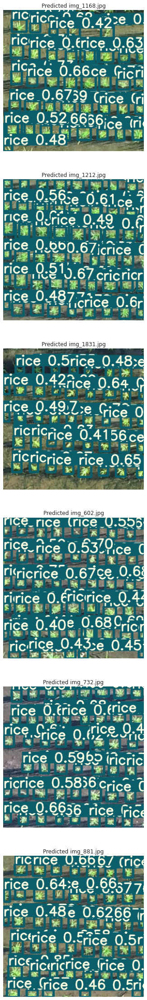

In [ ]:
sns.set({'figure.figsize':(60,40)})
fig, ax = plt.subplots(6, 1)
for i, img_f in enumerate(sorted([f for f in os.listdir('/content/yolor/inference/output/') if f.endswith('.jpg')][0:6])):
    image = vision.open_image('/content/yolor/inference/output/'+img_f)
    image.show(ax=ax[i], title= 'Predicted '+img_f)
    #plot_BBox(img_f, ax[i][1])
plt.show()

A partir do .txt com os boundboxes detectados vamos converter o ponto central para latitude e longitude:

In [ ]:
ls_x = []
ls_y = []
imgs_to_pred = [f for f in os.listdir('/content/yolor/inference/output/') if f.endswith('.txt')]
for images in imgs_to_pred:
  filename = images.split('.')[0]
  src = rasterio.open('/content/Predict/' + filename + '.tif')
  path = f'/content/yolor/inference/output/'+filename+'.txt'
  cols = ['class', 'x-center', 'y-center', 'width', 'height', 'conf-score']
  df = pd.read_csv(path, sep=" ", header=None)
  df.columns = cols
  df['x-center'] = np.round(df['x-center'] * 320)
  df['y-center'] = np.round(df['y-center'] * 320)
  for i,row in df.iterrows():
    xs, ys = rasterio.transform.xy(src.transform, row['y-center'], row['x-center'])
    ls_x.append(xs)
    ls_y.append(ys)

In [ ]:
df_xy = pd.DataFrame([])
df_xy['x'] = ls_x
df_xy['y'] = ls_y

Por fim, criamos um dataframe de pontos:

In [ ]:
gdf = gpd.GeoDataFrame(df_xy, geometry=gpd.points_from_xy(df_xy['x'], df_xy['y']))

In [ ]:
gdf = gdf.set_crs(src_img.crs.to_dict()['init'])

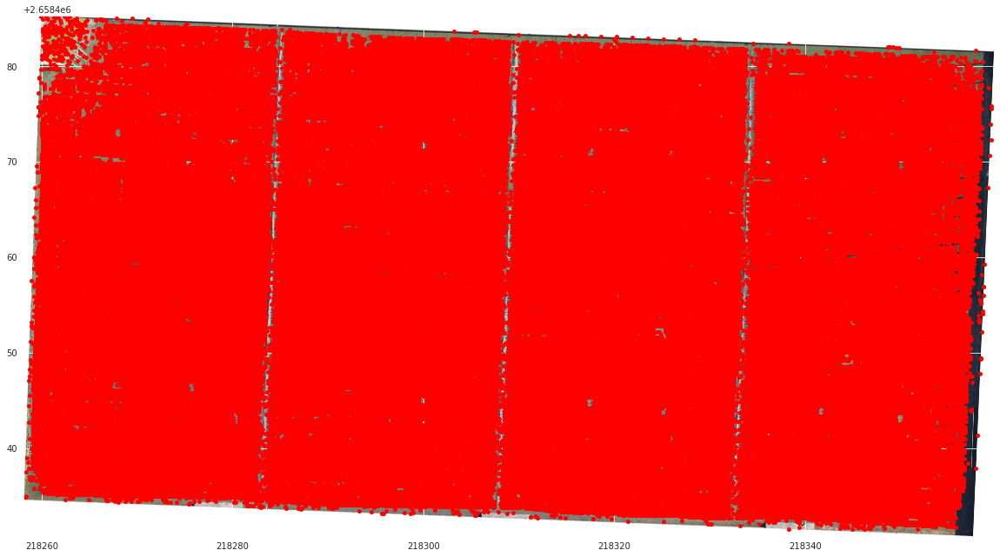

In [ ]:
fig, ax = plt.subplots(figsize=(20, 20))
show((src_img), ax=ax)
gdf.plot(ax=ax,  marker='o', color='red', markersize=15)

E salvamos um arquivo .json:

In [ ]:
gdf.to_file('/content/rice.json', driver="GeoJSON")

Referencias:

https://viso.ai/deep-learning/yolor/

https://medium.com/augmented-startups/is-yolor-better-and-faster-than-yolov4-54812da66cc1